# Inspect data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os
import sys

ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from datasets.data import get_dataset
from plot import draw_instances

## Notebook preference

In [2]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return fig, ax

## csv files

In [3]:
# train data csv
train_csv = "../statistic_description/tmp/train.csv"
train_df = pd.read_csv(train_csv, na_filter=False)
train_df = train_df.loc[train_df["annotation"].astype(bool)].reset_index(drop=True)
train_df.head()

,image_path,annotation
0,/home/stat-caolei/code/FasterDetection/data/TC...,0 336 1260 496 1352;0 1647 1851 1731 1986;0 85...
1,/home/stat-caolei/code/FasterDetection/data/TC...,0 220 653 334 767
2,/home/stat-caolei/code/FasterDetection/data/TC...,0 1115 1899 1286 2040
3,/home/stat-caolei/code/FasterDetection/data/TC...,0 1235 1920 1361 2016
4,/home/stat-caolei/code/FasterDetection/data/TC...,0 1756 1107 1959 1243


In [4]:
# val data csv, because there may be images without instance in practice, so we dont pick out those without 
# instances
val_csv = "../statistic_description/tmp/val.csv"
val_df = pd.read_csv(val_csv, na_filter=False)
val_df.head()

,image_path,annotation
0,/home/stat-caolei/code/FasterDetection/data/TC...,
1,/home/stat-caolei/code/FasterDetection/data/TC...,
2,/home/stat-caolei/code/FasterDetection/data/TC...,0 1968 1100 2046 1241
3,/home/stat-caolei/code/FasterDetection/data/TC...,
4,/home/stat-caolei/code/FasterDetection/data/TC...,0 1388 851 1524 986;0 115 1899 262 2043;0 472 ...


### Statistic description

In [5]:
df1 = pd.read_csv("/home/stat-caolei/code/TCT_Detection_new/statistic_description/train.csv", header=None)
df2 = pd.read_csv("/home/stat-caolei/code/TCT_Detection_new/statistic_description/val.csv", header=None)
df3 = pd.read_csv("/home/stat-caolei/code/TCT_Detection_new/statistic_description/test.csv", header=None)
df_total = pd.concat([df1, df2, df3], axis=0)
df_total.columns = ["path", "x1", "y1", "x2", "y2", "label"]
df_total["width"] = df_total["x2"] - df_total["x1"]
df_total["height"] = df_total["y2"] - df_total["y1"]
df_total["h/w"] = df_total["height"] / df_total["width"]
df_total["area"] = df_total["height"] * df_total["width"]
df_total["scale"] = df_total["area"].map(lambda x: (x<32*32 and "small")
                                         or (32*32<=x<=96*96 and "medium")
                                         or (x>96*96 and "large"))
df_total["scale_range"] = df_total["area"].map(lambda x: (x<64*64 and "~64")
                                               or (64*64<=x<128*128 and "64~128")
                                               or (128*128<=x<256*256 and "128~256")
                                               or (256*256<=x<512*512 and "256~512")
                                               or (x>=512*512 and "512~"))
df_total.head()

,path,x1,y1,x2,y2,label,width,height,h/w,area,scale,scale_range
0,/home/stat-caolei/code/FasterDetection/data/VO...,1803,1079,1938,1184,Positive,135,105,0.777778,14175,large,64~128
1,/home/stat-caolei/code/FasterDetection/data/VO...,1448,94,1560,211,Positive,112,117,1.044643,13104,large,64~128
2,/home/stat-caolei/code/FasterDetection/data/VO...,328,0,460,121,Positive,132,121,0.916667,15972,large,64~128
3,/home/stat-caolei/code/FasterDetection/data/VO...,884,425,1043,572,Positive,159,147,0.924528,23373,large,128~256
4,/home/stat-caolei/code/FasterDetection/data/VO...,430,650,578,803,Positive,148,153,1.033784,22644,large,128~256


In [6]:
print("Number of bbox: ", len(df_total))
print("Number of small objects: ", sum(df_total["scale"]=="small"))
print("Number of medium objects: ", sum(df_total["scale"] == "medium"))
print("Number of large objects: ", sum(df_total["scale"] == "large"))

print("Box Height. mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(np.mean(df_total["height"]),
                                                                                  np.median(df_total["height"]),
                                                                                  np.min(df_total["height"]),
                                                                                  np.max(df_total["height"])))
print("Box Width. mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(np.mean(df_total["width"]),
                                                                                  np.median(df_total["width"]),
                                                                                  np.min(df_total["width"]),
                                                                                  np.max(df_total["width"])))
print("Box area. mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(np.mean(df_total["area"]),
                                                                                np.median(df_total["area"]),
                                                                                np.min(df_total["area"]),
                                                                                np.max(df_total["area"])))

Number of bbox:  10108
Number of small objects:  17
Number of medium objects:  531
Number of large objects:  9560
Box Height. mean: 168.51  median: 154.00  min: 2.00  max: 835.00
Box Width. mean: 173.32  median: 159.00  min: 3.00  max: 766.00
Box area. mean: 32365.67  median: 24552.00  min: 9.00  max: 584500.00


### Statistical figures

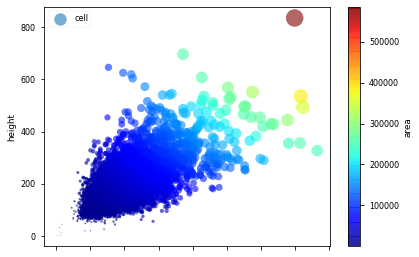

In [7]:
# bubble plot of bbox height and width
plt.style.use('seaborn-paper')
df_total.plot(kind="scatter", x="width", y="height", alpha=0.6, s=df_total["area"] / 2000,
              label="cell", c="area", cmap=plt.get_cmap("jet"), colorbar=True)
plt.xlabel("width")
plt.ylabel("height")
plt.show()
#plt.savefig("bubble.svg", dpi=400, format="svg")

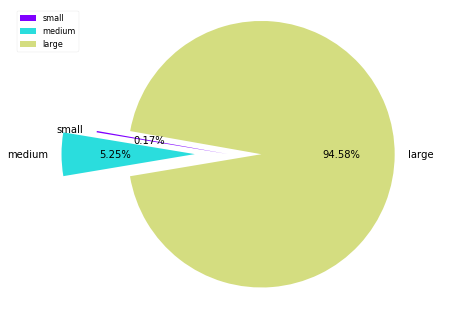

In [8]:
from matplotlib import font_manager as fm
from  matplotlib import cm

explode = (0, 0.1, 0.1)  # "explode" ， show the selected slice
shapes = ['small', 'medium', 'large']
values = [17, 531, 9560]
s = pd.Series(values, index=shapes)
sizes = s.values
labels = s.index
#fig, axes = plt.subplots(figsize=(8,5),ncols=2) # 设置绘图区域大小
#ax1, ax2 = axes.ravel()

colors = cm.rainbow(np.arange(len(sizes))/len(sizes)) # colormaps: Paired, autumn, rainbow, gray,spring,Darks
patches, texts, autotexts = plt.pie(sizes, labels=labels, autopct='%3.2f%%',explode=explode,
        shadow=False, startangle=170, colors=colors, radius=0.4)
# labeldistance: 控制labels显示的位置
# pctdistance: 控制百分比显示的位置
# radius: 控制切片突出的距离

plt.axis('equal')  

# 重新设置字体大小
proptease = fm.FontProperties()
proptease.set_size('medium')
# font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
plt.setp(autotexts, fontproperties=proptease)
plt.setp(texts, fontproperties=proptease)
plt.legend()
#ax1.set_title('Shapes', loc='center')

# ax2 只显示图例（legend）
#ax2.axis('off')
#ax2.legend(patches, labels, loc='center left')

plt.tight_layout()

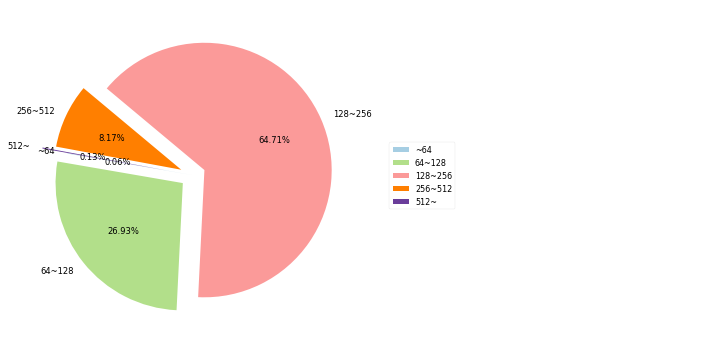

In [9]:
explode = (0, 0.1, 0.1, 0.1, 0.2)

shapes = ['~64', '64~128', '128~256', '256~512', '512~']
values = [6, 2717, 6528, 824, 13]
s = pd.Series(values, index=shapes)
sizes = s.values
labels = s.index
fig, axes = plt.subplots(figsize=(10,5),ncols=2) # 设置绘图区域大小
ax1, ax2 = axes.ravel()

colors = cm.Paired(np.arange(len(sizes))/len(sizes)) # colormaps: Paired, autumn, rainbow, gray,spring,Darks
patches, texts, autotexts = ax1.pie(sizes, labels=labels, autopct='%3.2f%%',
        shadow=False, startangle=170, colors=colors, explode=explode)

ax1.axis('equal')  

# 重新设置字体大小
proptease = fm.FontProperties()
proptease.set_size('small')
# font size include: ‘xx-small’,x-small’,'small’,'medium’,‘large’,‘x-large’,‘xx-large’ or number, e.g. '12'
plt.setp(autotexts, fontproperties=proptease)
plt.setp(texts, fontproperties=proptease)

#ax1.set_title('Shapes', loc='center')

# ax2 只显示图例（legend）
ax2.axis('off')
ax2.legend(patches, labels, loc='center left')

plt.tight_layout()

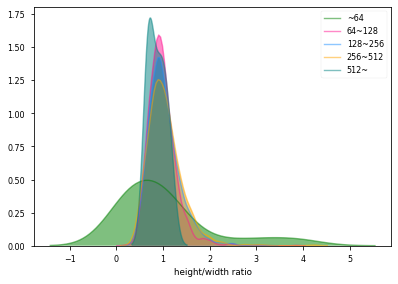

In [10]:
import seaborn as sns

plt.style.use("seaborn-paper")
sns.kdeplot(df_total.loc[df_total['scale_range'] == '~64', "h/w"], shade=True, color="g", label="~64", alpha=.5)
sns.kdeplot(df_total.loc[df_total['scale_range'] == '64~128', "h/w"], shade=True, color="deeppink", label="64~128", alpha=.5)
sns.kdeplot(df_total.loc[df_total['scale_range'] == '128~256', "h/w"], shade=True, color="dodgerblue", label="128~256", alpha=.5)
sns.kdeplot(df_total.loc[df_total['scale_range'] == '256~512', "h/w"], shade=True, color="orange", label="256~512", alpha=.5)
sns.kdeplot(df_total.loc[df_total['scale_range'] == '512~', "h/w"], shade=True, color="teal", label="512~", alpha=.5)
plt.xlabel('height/width ratio')
plt.legend()

Nucleus Aspect Ratio.  mean: 1.02  median: 0.97  min: 0.12  max: 4.22


[Text(0.5, 0, 'aspect_ratio')]

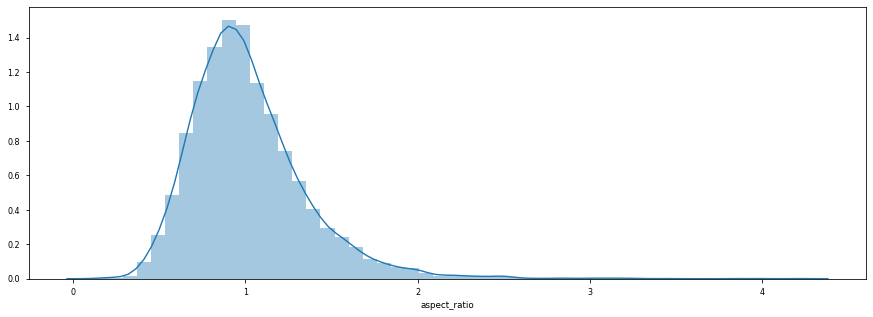

In [11]:
plt.style.use("seaborn-paper")
bbox_aspect_ratio = df_total["h/w"]
print("Nucleus Aspect Ratio.  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(bbox_aspect_ratio), np.median(bbox_aspect_ratio),
    np.min(bbox_aspect_ratio), np.max(bbox_aspect_ratio)))
plt.figure(figsize=(15, 5))
ax = sns.distplot(bbox_aspect_ratio)
ax.set(xlabel="aspect_ratio")
#ax.set_xticks(range(0, 4, 1))
#plt.savefig("aspect_ratio.svg", dpi=400, format="svg")

## Dataset
The returned results of train and validation differs

In [12]:
dataset_train = get_dataset(train_csv, datatype="train", transform=None)
print("Number of training images: ", len(dataset_train))
dataset_val = get_dataset(val_csv, datatype="val", transform=None)
print("Number of validation images (including images without instances): ", len(dataset_val))

Number of training images:  5057
Number of validation images (including images without instances):  1256


### Annotation infos

In [13]:
img, target = dataset_train[0]
print("Training image: ", img)
print("Training image annotations:")
print(" boxes coordinates:\n", target["boxes"])
print(" boxes labels: ", target["labels"])
print(" image path: ", "".join([chr(i) for i in target["name"]]))

Training image:  <PIL.Image.Image image mode=RGB size=2048x2048 at 0x7FEE51DDC0B8>
Training image annotations:
 boxes coordinates:
 tensor([[ 336., 1260.,  496., 1352.],
        [1647., 1851., 1731., 1986.],
        [ 851.,  797., 1022.,  965.]])
 boxes labels:  tensor([1, 1, 1])
 image path:  /home/stat-caolei/code/FasterDetection/data/TCT/JPEGImages/1673bj024_0034.png


### Display samples

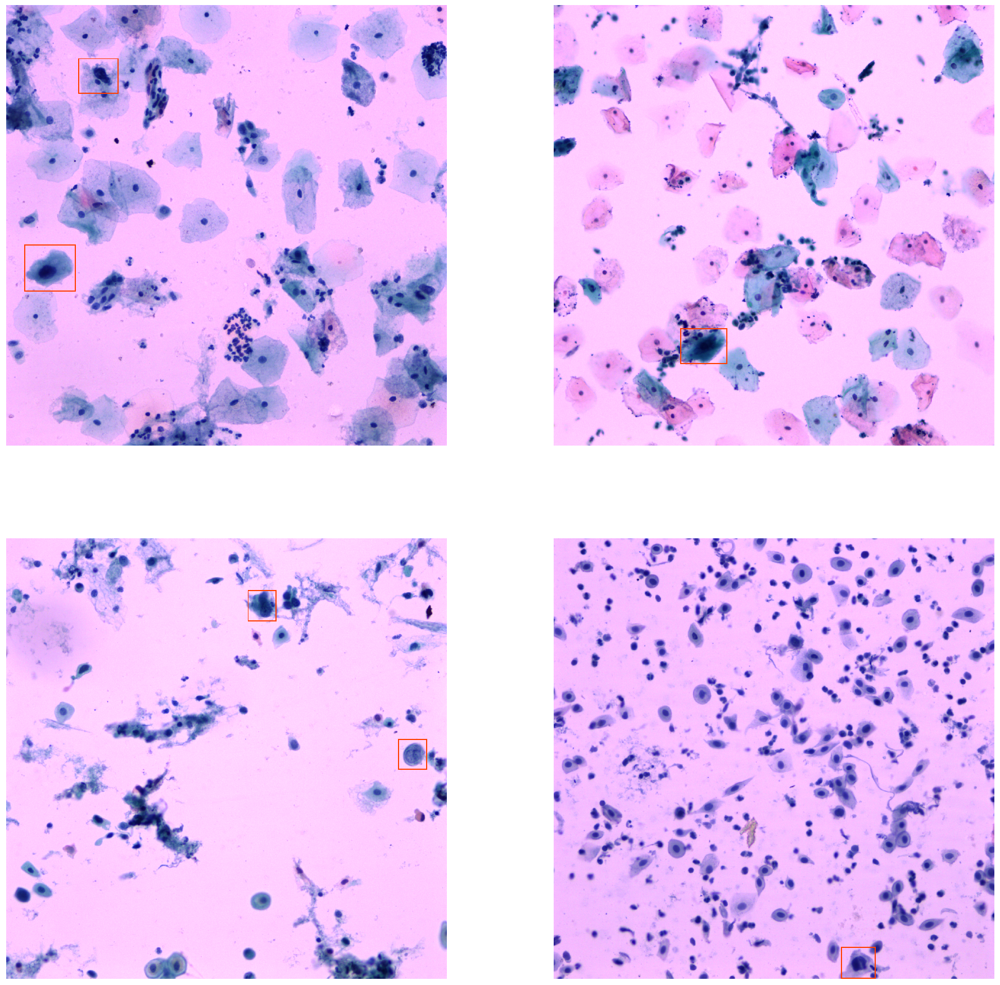

In [14]:
# load and display random samples
image_ids = np.random.choice(len(dataset_train), 4)

fig, ax = get_ax(rows=2, cols=4//2)
for i, image_id in enumerate(image_ids):
    image, target = dataset_train[image_id]
    image_path = "".join([chr(j) for j in target["name"]])
    draw_instances(image, target["boxes"], title=None, ax=ax[i//2, i%2])
plt.show()

### Image Augmentation

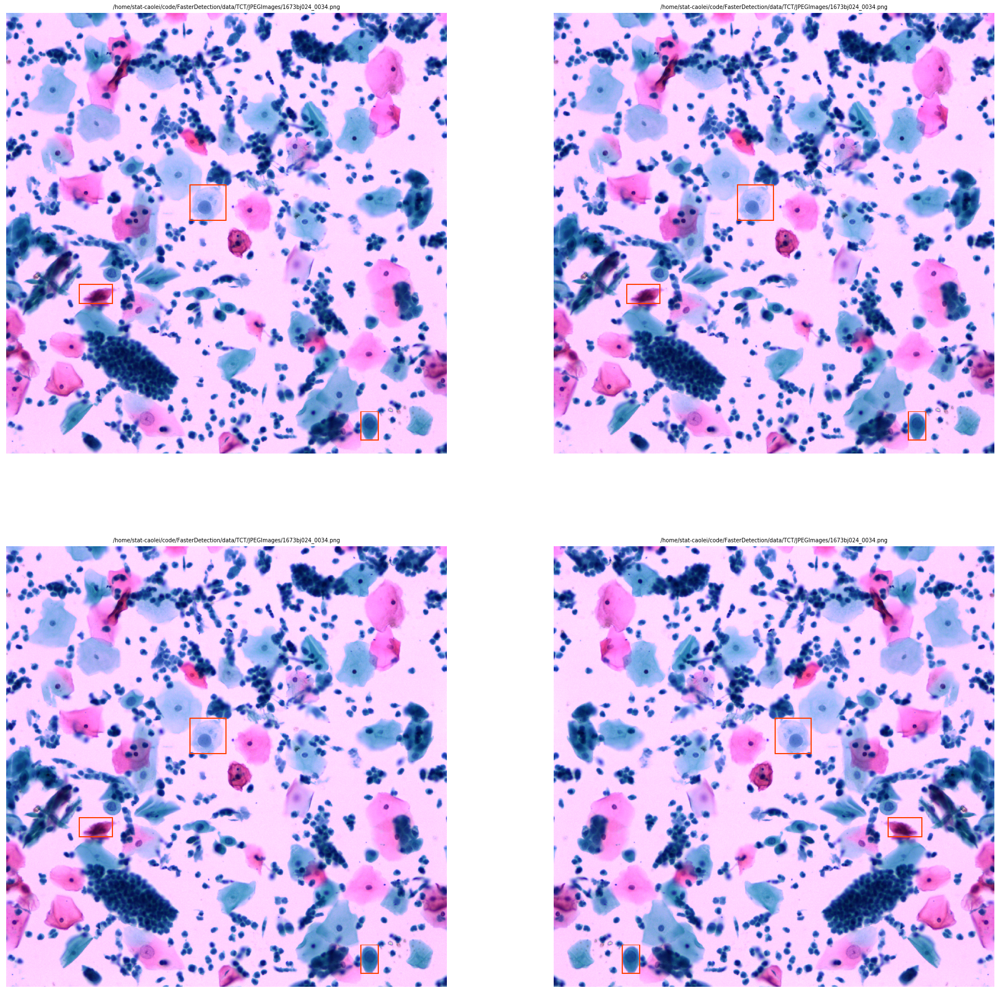

In [15]:
from imgaug import augmenters as iaa
from run import get_transform
from torchvision import transforms
from plot import UnNormalize


unorm = UnNormalize([0.485, 0.456, 0.406],
                    [0.229, 0.224, 0.225])
topil = transforms.ToPILImage()
trans = get_transform(train=True)
image_id = np.random.choice(len(dataset_train), 1)
fig, ax = get_ax(rows=2, cols=4//2)
for i, _ in enumerate(range(4)):
    dataset_train_aug = get_dataset(train_csv, datatype="train", transform=trans)
    image, target = dataset_train_aug[0]
    image = topil(unorm(image))
    image_path = "".join([chr(j) for j in target["name"]])
    
    draw_instances(image, target["boxes"], title=image_path, ax=ax[i//2, i%2])
plt.show()